In [119]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import sklearn.preprocessing as pp

import os
import warnings

plt.style.use('bmh')
warnings.filterwarnings('ignore')

RS = 8 #random_state

# IO utils


In [120]:
def read_omg_csv(path_palm_data: str, 
                 n_omg_channels: int, 
                 n_acc_channels: int = 0, 
                 n_gyr_channels: int = 0, 
                 n_mag_channels: int = 0, 
                 n_enc_channels: int = 0,
                 button_ch: bool = True, 
                 sync_ch: bool = True, 
                 timestamp_ch: bool = True) -> pd.DataFrame:
    
    '''
    Reads CSV data for OMG data
    NB: data must be separated by " " separator

    Parameters:
    ---ы
        path_palm_data  (str): path to csv data file
        n_omg_channels  (int): Number of OMG channels
        n_acc_channels  (int): Number of Accelerometer channels,      default = 0
        n_gyr_channels  (int): Number of Gyroscope channels,          default = 0
        n_mag_channels  (int): Number of Magnetometer channels,       default = 0
        n_enc_channels  (int): Number of Encoder channels,            default = 0
        button_ch      (bool): If button channel is present,          default = True
        sync_ch        (bool): If synchronization channel is present, default = True
        timestamp_ch   (bool): If timestamp channel is present,       default = True

    Returns:
    ---
        df_raw (pd.DataFrame): Parsed pandas Dataframe with OMG data
    '''
    
    df_raw = pd.read_csv(path_palm_data, sep=' ', 
                         header=None, 
                         skipfooter=1, 
                         skiprows=1, 
                         engine='python')
    columns = np.arange(n_omg_channels).astype('str').tolist()
    
    for label, label_count in zip(['ACC', 'GYR', 'MAG', 'ENC'], 
                                  [n_acc_channels, n_gyr_channels, n_mag_channels, n_enc_channels]):
        columns = columns + ['{}{}'.format(label, i) for i in range(label_count)]
        
    if button_ch:
        columns = columns + ['BUTTON']
        
    if sync_ch:
        columns = columns + ['SYNC']
        
    if timestamp_ch:
        columns = columns + ['ts']
        
    df_raw.columns = columns
    
    return df_raw

# Data

In [121]:
datas = []

for dirname, _, filenames in os.walk('.\data'):
    for filename in filenames:
        datas.append(os.path.join(dirname, filename))

datas = list(filter(lambda x: True if 'protocol' not in x else False, datas))


data_names = []

for path in datas:    
    d_path = path.split('\\')[-1]
    
    data_names.append(d_path)

data_names.remove('meta_information.csv')


data_names

['2023-04-18_19-08-47 gestures train.palm',
 '2023-05-05_17-57-30.palm',
 '2023-05-07_15-19-05.palm',
 '2023-05-07_16-54-27.palm',
 '2023-05-12_19-17-00.palm',
 '2023-05-15_16-16-08.palm',
 '2023-05-15_17-12-24.palm',
 '2023-05-19_12-04-02.palm',
 '2023-05-22_17-04-29.palm',
 '2023-05-22_20-22-01.palm',
 '2023-05-31_15-46-37.palm',
 '2023-05-31_17-14-41.palm',
 '2023-06-05_16-12-38.palm',
 '2023-06-05_17-53-01.palm',
 '2023-06-20_12-34-17.palm',
 '2023-06-20_13-30-15.palm',
 '2023-06-20_14-43-11.palm',
 '2023-09-12_12-55-22.palm',
 '2023-09-12_14-59-23.palm',
 '2023-09-13_22-14-05.palm',
 '2023-09-29_09-20-47.palm',
 '2023-09-29_11-03-50.palm',
 '2023-09-30_08-06-44.palm',
 '2023-10-18_08-05-29.palm',
 '2023-10-18_11-16-21.palm',
 '2023-10-23_10-11-45.palm',
 '2023-10-23_14-07-13.palm',
 '2023-10-23_16-23-02.palm',
 '2023-10-25_08-52-30.palm',
 '2023-10-25_11-08-46.palm',
 'patched_2023-10-25_09-44-02.palm']

In [122]:
palm_file = './data/' + data_names[0]
gestures = read_omg_csv(palm_file, 
                        n_omg_channels=50,
                        n_acc_channels=3, 
                        n_gyr_channels=3, 
                        n_enc_channels=6, 
                        n_mag_channels=0)

gestures

,0,1,2,3,4,5,6,7,8,9,...,GYR2,ENC0,ENC1,ENC2,ENC3,ENC4,ENC5,BUTTON,SYNC,ts
0,10,8,28,2846,2931,2873,2597,24,8,13,...,31,0,0,0,0,0,0,0,0,1174989
1,16,8,29,2847,2930,2875,2598,24,8,6,...,31,0,0,0,0,0,0,0,0,1175022
2,10,8,29,2847,2930,2875,2598,25,8,5,...,30,0,0,0,0,0,0,0,0,1175055
3,0,8,29,2845,2927,2870,2594,24,8,6,...,30,0,0,0,0,0,0,0,0,1175088
4,9,8,25,2851,2933,2877,2599,24,8,6,...,28,0,0,0,0,0,0,0,0,1175121
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37603,10,5,17,2369,2498,2677,2425,20,8,5,...,31,0,0,0,0,0,0,0,0,2415888
37604,10,7,21,2400,2529,2697,2441,21,17,6,...,30,0,0,0,0,0,0,0,0,2415921
37605,10,6,21,2429,2557,2713,2454,19,7,5,...,33,0,0,0,0,0,0,0,0,2415954
37606,0,7,18,2446,2565,2720,2459,22,8,6,...,31,0,0,0,0,0,0,0,0,2415987


### Abbreviations
* OMG — optomiography  
* ACC — accelerometer  
* GYR — gyroscope  
* ENC — encoders (fingers of prosthesis or gloves)  
* model — model of data  

### X features 
* '0', ..., '49' - каналы OMG датчиков
* 'ACC0', 'ACC1', 'ACC2' - акселерометр (потенциально могут использоваться как факторы для модели)
* 'GYR0', 'GYR1', 'GYR2' - гироскоп     (потенциально могут использоваться как факторы для модели)
* 'BUTTON' - не используется
* 'SYNC' - синхронизация данных с протоколом
* 'ts' - метка времени

In [123]:
gestures.columns 

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24',
       '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36',
       '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48',
       '49', 'ACC0', 'ACC1', 'ACC2', 'GYR0', 'GYR1', 'GYR2', 'ENC0', 'ENC1',
       'ENC2', 'ENC3', 'ENC4', 'ENC5', 'BUTTON', 'SYNC', 'ts'],
      dtype='object')

In [124]:
OMG_CH = [str(i) for i in range(50)]

ACC_CH = ['ACC0', 'ACC1', 'ACC2']
GYR_CH = ['GYR0', 'GYR1', 'GYR2']
ENC_CH = ['ENC0', 'ENC1', 'ENC2', 'ENC3', 'ENC4', 'ENC5']
BUTTON_SYNC_TS_CH = ['BUTTON', 'SYNC', 'ts']

assert len(OMG_CH)+len(ACC_CH)+len(GYR_CH)+len(ENC_CH)+len(BUTTON_SYNC_TS_CH) == gestures.shape[-1]

print(f"OMG_CH: {list(OMG_CH)}")
print(f"ACC_CH: {list(ACC_CH)}")
print(f"GYR_CH: {list(GYR_CH)}")
print(f"ENC_CH: {list(ENC_CH)}")
print(f"BUTTON_SYNC_TS_CH: {list(BUTTON_SYNC_TS_CH)}")

OMG_CH: ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49']
ACC_CH: ['ACC0', 'ACC1', 'ACC2']
GYR_CH: ['GYR0', 'GYR1', 'GYR2']
ENC_CH: ['ENC0', 'ENC1', 'ENC2', 'ENC3', 'ENC4', 'ENC5']
BUTTON_SYNC_TS_CH: ['BUTTON', 'SYNC', 'ts']


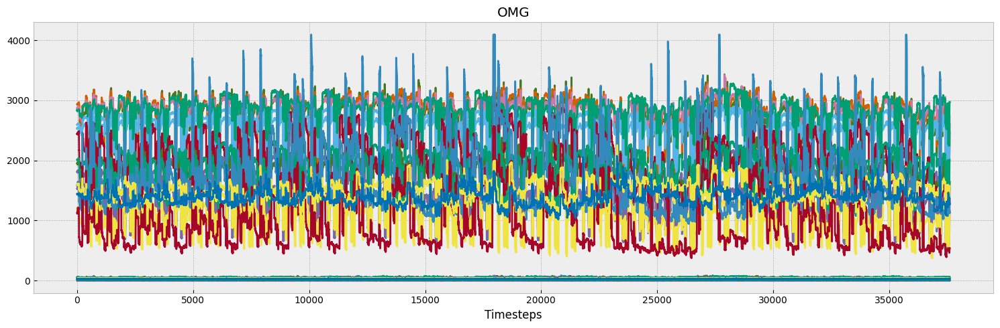

In [125]:
fig = plt.figure(figsize=(15, 5))
plt.plot(gestures[OMG_CH].values)
plt.title('OMG')
plt.xlabel('Timesteps')
plt.tight_layout()

# Protocol

In [126]:
gestures_protocol = pd.read_csv(f'{palm_file}.protocol.csv', index_col=0)

gestures_protocol

,Thumb,Index,Middle,Ring,Pinky,Thumb_stretch,Index_stretch,Middle_stretch,Ring_stretch,Pinky_stretch,Pronation
epoch,,,,,,,,,,,
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
302,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
303,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
304,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0


In [127]:
le = pp.LabelEncoder()

# FIT & TRANSFORM
gestures_protocol['gesture'] = le.fit_transform(
    gestures_protocol[[
        "Thumb", "Index", "Middle", "Ring", "Pinky",
        'Thumb_stretch', 'Index_stretch', 'Middle_stretch', 'Ring_stretch', 'Pinky_stretch'
    ]]
    .apply(lambda row: str(tuple(row)), axis=1)
)

display(np.c_[le.transform(le.classes_), le.classes_])

gestures_protocol['gesture']

array([[0, '(0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)'],
       [1, '(0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0)'],
       [2, '(0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0)'],
       [3, '(1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)'],
       [4, '(1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)'],
       [5, '(1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0)']],
      dtype=object)

epoch
0      0
1      0
2      3
3      5
4      1
      ..
302    3
303    5
304    1
305    4
306    2
Name: gesture, Length: 307, dtype: int32

In [128]:
GESTURES = ['Neutral', 'Open', 'Pistol', 'Thumb', 'OK', 'Grab']
NUM_G = len(GESTURES)

GESTURES, NUM_G

(['Neutral', 'Open', 'Pistol', 'Thumb', 'OK', 'Grab'], 6)

In [129]:
y_cmd = np.array([gestures_protocol['gesture'].loc[s] for s in gestures['SYNC'].values])

y_cmd, len(y_cmd)

(array([0, 0, 0, ..., 0, 0, 0]), 37608)

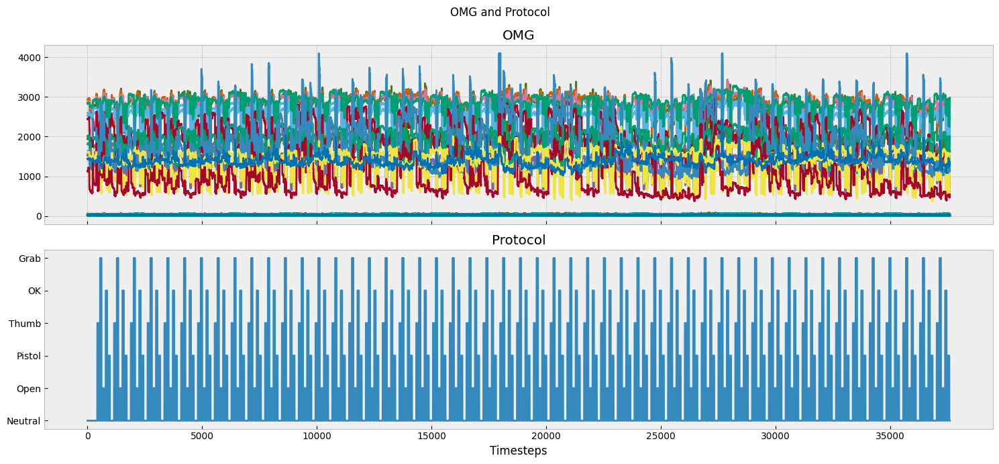

In [130]:
fig, axx = plt.subplots(2, 1, sharex=True, figsize=(15, 7))
plt.sca(axx[0])
plt.plot(gestures[OMG_CH].values)
plt.title('OMG')

plt.sca(axx[1])
plt.plot(y_cmd)
plt.grid()
plt.yticks(np.arange(len(GESTURES)), GESTURES)
plt.xlabel('Timesteps')
plt.title('Protocol')

plt.suptitle('OMG and Protocol')
plt.tight_layout()

# Preprocessing

In [131]:
gestures_omg_ch = gestures[OMG_CH]

gestures_omg_ch

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
0,10,8,28,2846,2931,2873,2597,24,8,13,...,32,28,10,11,8,5,8,13,32,25
1,16,8,29,2847,2930,2875,2598,24,8,6,...,33,31,10,12,8,5,9,14,36,28
2,10,8,29,2847,2930,2875,2598,25,8,5,...,11,30,11,12,8,7,8,14,36,28
3,0,8,29,2845,2927,2870,2594,24,8,6,...,33,32,10,12,0,6,10,14,36,28
4,9,8,25,2851,2933,2877,2599,24,8,6,...,32,29,10,11,6,5,9,13,33,33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37603,10,5,17,2369,2498,2677,2425,20,8,5,...,28,25,10,10,7,6,9,13,34,24
37604,10,7,21,2400,2529,2697,2441,21,17,6,...,30,24,10,10,7,5,8,11,35,25
37605,10,6,21,2429,2557,2713,2454,19,7,5,...,28,24,18,9,7,5,9,13,33,25
37606,0,7,18,2446,2565,2720,2459,22,8,6,...,12,26,11,8,7,6,9,15,36,27


In [132]:
y_bin = pd.Series(y_cmd).apply(lambda x: 1 if x != 0 else x)

y_bin.value_counts()

0    22144
1    15464
Name: count, dtype: int64

### Shifting

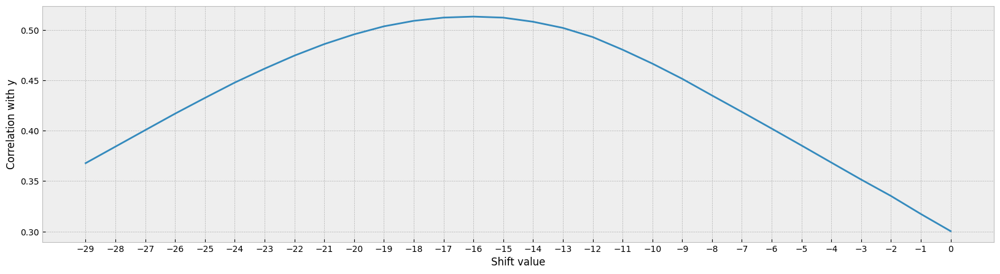

In [133]:
def select_shift(data, t_bin=y_bin, plot=False):
    shift_corr = pd.Series() 
    
    scaler = pp.StandardScaler()
    temp_scaled = scaler.fit_transform(data) 

    scaled_temp = pd.DataFrame(temp_scaled).abs()  
    scaled_temp['disp'] = scaled_temp.sum(axis=1)

    for shift_value in range(0, -30, -1):  
        shifted_temp = (scaled_temp
                        .shift(shift_value)
                        .fillna(scaled_temp.median()))
        
        shift_corr.loc[shift_value] = shifted_temp['disp'].corr(t_bin)
        
    if plot:
        plt.figure(figsize=(20, 5))
        sns.lineplot(shift_corr)

        plt.xticks(range(0, -30, -1))
        plt.xlabel('Shift value')
        plt.ylabel('Correlation with y')
        plt.show()
    else:
        best_shift = shift_corr.sort_values(ascending=False).index[0]
    
        return best_shift 


select_shift(gestures_omg_ch, plot=True)

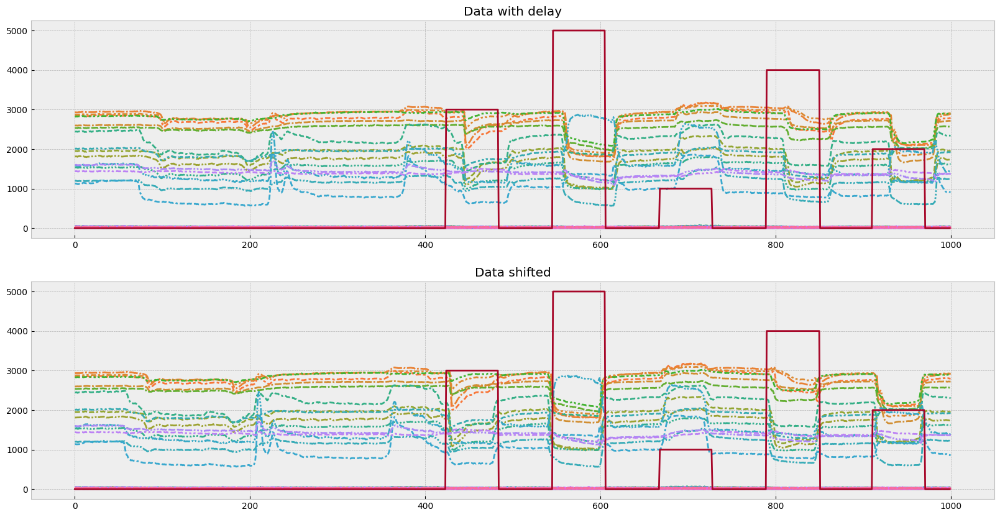

In [134]:
shift_data = lambda data, shift: data.shift(shift).fillna(0)


fig, ax = plt.subplots(2, 1, figsize=(20, 10))

sns.lineplot(gestures_omg_ch.loc[:1000], 
             legend=False, 
             ax=ax[0])
sns.lineplot(y_cmd[:1000]*1000, ax=ax[0])
ax[0].set_title('Data with delay')


best_shift = select_shift(gestures_omg_ch)
gestures_shifted = shift_data(gestures_omg_ch, best_shift)

sns.lineplot(gestures_shifted.loc[:1000], 
             legend=False, 
             ax=ax[1])
sns.lineplot(y_cmd[:1000]*1000, ax=ax[1])
ax[1].set_title('Data shifted')


fig.show()

### Scaling

In [135]:
def scale_data(data):
    scaler = pp.StandardScaler()

    data_scaled = pd.DataFrame(
        scaler.fit_transform(data), 
        columns=OMG_CH
    )
    
    return data_scaled

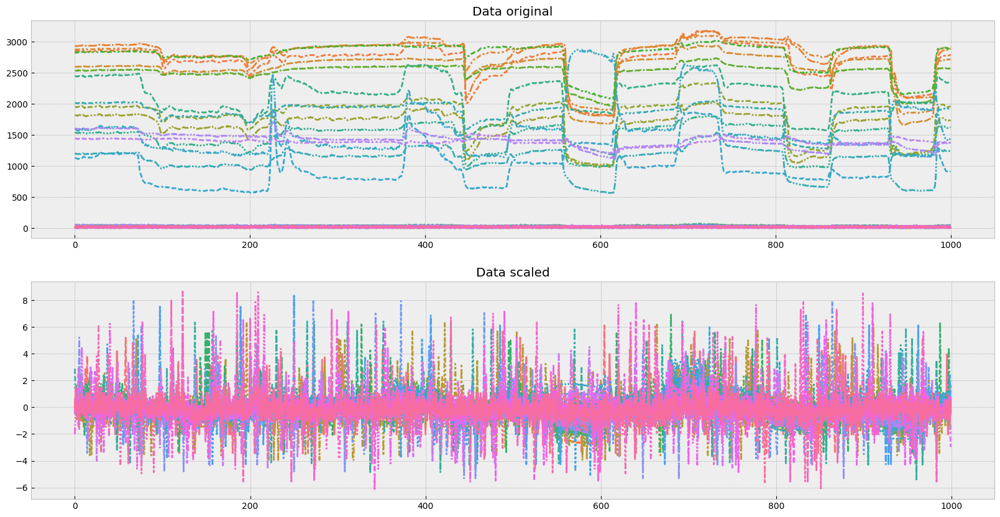

In [136]:
fig, ax = plt.subplots(2, 1, figsize=(20, 10))


sns.lineplot(gestures_omg_ch.loc[:1000], 
             legend=False, 
             ax=ax[0])
ax[0].set_title('Data original')


gestures_scaled = scale_data(gestures_shifted)

sns.lineplot(gestures_scaled.iloc[:1000], 
             legend=False, 
             ax=ax[1])
ax[1].set_title('Data scaled')


fig.show() 

### Smoothing

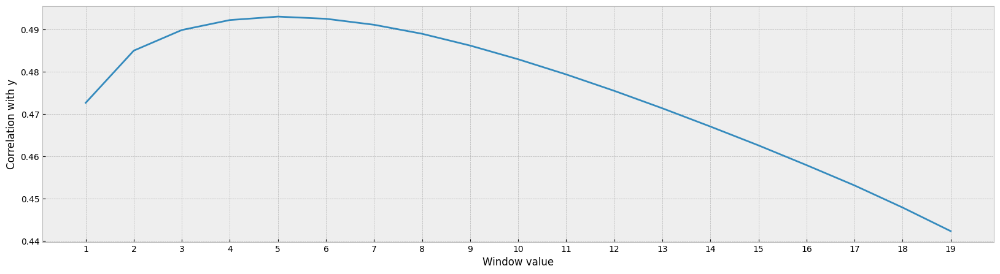

In [137]:
def select_window(data, t_bin=y_bin, plot=False):
    smooth_corr = pd.Series()
    
    temp = data.abs() 
    temp['disp'] = temp.sum(axis=1) 

    for win_value in range(1, 20):      
        smoothed_temp = (temp
                         .rolling(win_value, 1)
                         .sum())
        
        smooth_corr.loc[win_value] = smoothed_temp['disp'].corr(t_bin)
        
    if plot:
        plt.figure(figsize=(20, 5))
        sns.lineplot(smooth_corr)

        plt.xticks(range(1, 20))
        plt.xlabel('Window value')
        plt.ylabel('Correlation with y')
        plt.show()
    else:
        best_win = smooth_corr.sort_values(ascending=False).index[0]
    
        return best_win


select_window(gestures_scaled, plot=True)

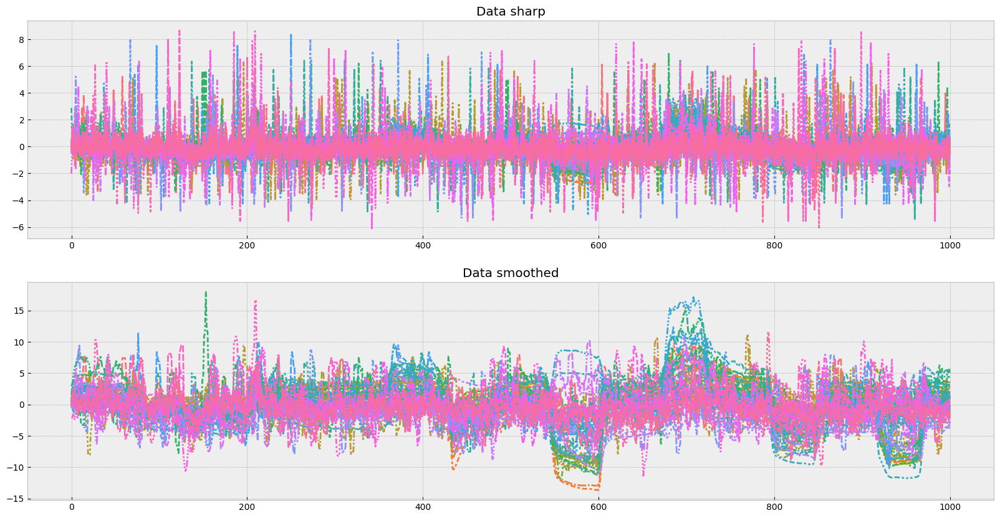

In [138]:
smoothe_data = lambda data, win: data.rolling(win, 1).sum()


fig, ax = plt.subplots(2, 1, figsize=(20, 10))

sns.lineplot(gestures_scaled.loc[:1000], 
             legend=False, 
             ax=ax[0])
ax[0].set_title('Data sharp')


best_win = select_window(gestures_scaled)
gestures_smoothed = smoothe_data(gestures_scaled, best_win)

sns.lineplot(gestures_smoothed.loc[:1000], 
             legend=False, 
             ax=ax[1])
ax[1].set_title('Data smoothed')


fig.show()

### Feature cleaning

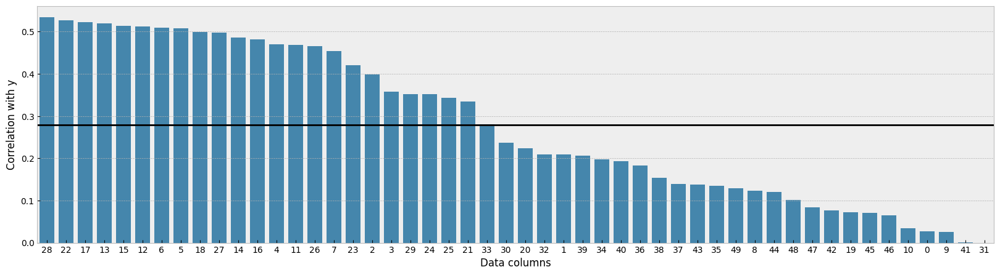

In [139]:
def select_features(data, t_bin=y_bin, plot=False):
    noise_corr = pd.Series()

    for col in OMG_CH:    
        correlation = data[col].corr(t_bin)
        noise_corr.loc[col] = abs(correlation)

    if plot:
        plt.figure(figsize=(20, 5))

        sns.barplot(noise_corr.sort_values(ascending=False))
        plt.axhline(noise_corr.mean(), color='black')

        plt.xlabel('Data columns')
        plt.ylabel('Correlation with y')
        plt.show()
    else:
        best_cols = (noise_corr
                     [noise_corr >= noise_corr.mean()]
                     .index.tolist())
        
        return best_cols


select_features(gestures_smoothed, plot=True)

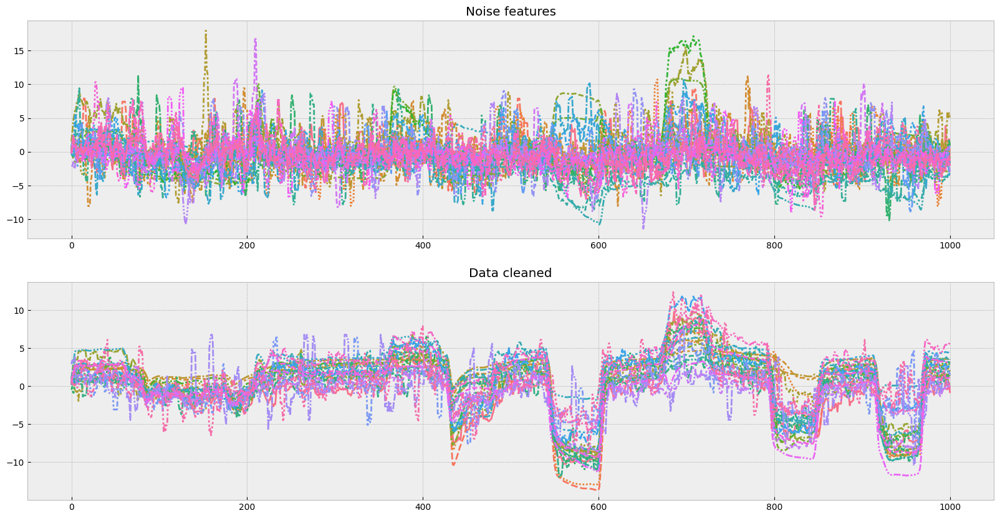

In [140]:
clean_data_features = lambda data, cols: data[cols]

best_cols = select_features(gestures_smoothed)
noisy_cols = gestures_smoothed.drop(best_cols, axis=1).columns


fig, ax = plt.subplots(2, 1, figsize=(20, 10))

sns.lineplot(gestures_smoothed.loc[:1000, noisy_cols], 
             legend=False, 
             ax=ax[0])
ax[0].set_title('Noise features')


gestures_cleaned = gestures_smoothed[best_cols]

sns.lineplot(gestures_cleaned.loc[:1000], 
             legend=False, 
             ax=ax[1])
ax[1].set_title('Data cleaned')


fig.show()

### Sample cleaning

In [141]:
def clean_data(X, y=y_cmd):
    X_y = pd.concat([X, pd.Series(y, name='y')], axis=1)

    cleaned_X = X.copy()

    for g in range(NUM_G):
        gest_X = X[X_y['y'] == g]

        mu, left_q, right_q = (gest_X.median(),
                               gest_X.quantile(0.1), 
                               gest_X.quantile(0.9))

        gest_cleaned = gest_X[(X > left_q) & 
                              (X < right_q)].fillna(mu)

        cleaned_X.loc[gest_cleaned.index] = gest_cleaned
        
    return cleaned_X

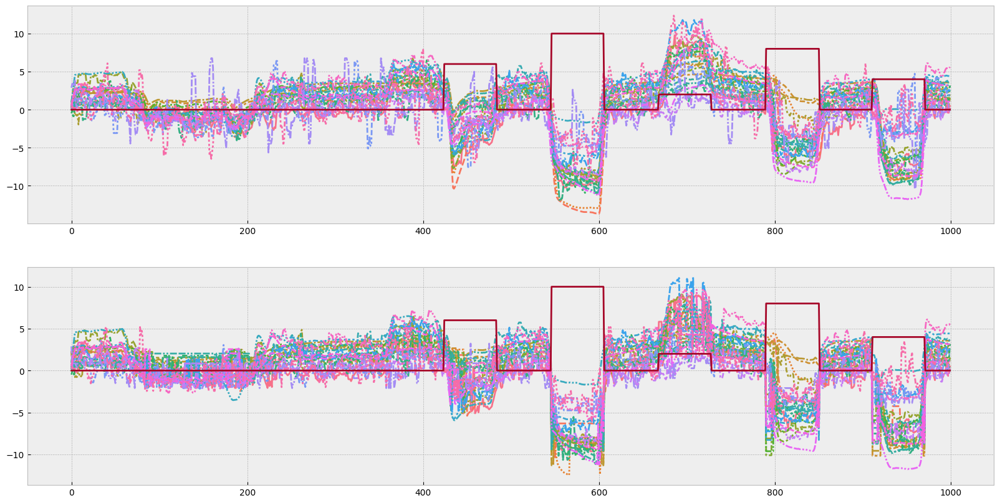

In [142]:
fig, ax = plt.subplots(2, 1, figsize=(20, 10))


sns.lineplot(gestures_cleaned.iloc[:1000], 
             legend=False, 
             ax=ax[0])
sns.lineplot(y_cmd[:1000]*2, ax=ax[0])


X_data = clean_data(gestures_cleaned)

sns.lineplot(X_data.iloc[:1000], 
             legend=False, 
             ax=ax[1])
sns.lineplot(y_cmd[:1000]*2, ax=ax[1])


fig.show()

# Train-test split

In [143]:
df_meta = pd.read_csv('./data/meta_information.csv', index_col=0)
df_meta 

,montage,pilote_id,last_train_idx,len(train),len(test)
0,2023-05-15_16-16-08.palm,1,23337,23337,5810
1,2023-05-15_17-12-24.palm,1,23336,23336,5803
2,2023-06-05_16-12-38.palm,1,17939,17939,4431
3,2023-06-05_17-53-01.palm,1,17771,17771,4435
4,2023-06-20_14-43-11.palm,1,17936,17936,4441
5,2023-06-20_13-30-15.palm,1,17928,17928,4435
6,2023-06-20_12-34-17.palm,1,17758,17758,4444
7,2023-09-30_08-06-44.palm,2,5693,5693,5509
8,2023-09-29_11-03-50.palm,2,5694,5694,5511
9,2023-09-29_09-20-47.palm,2,5690,5690,5507


In [144]:
def train_test_split(palm_file, X, y=y_cmd):
    palm_mask = df_meta['montage'] == palm_file.split('/')[-1]
    
    last_train_idx = df_meta[palm_mask]['last_train_idx'].values[0]
    pilote_id = df_meta[palm_mask]['pilote_id'].values[0]
    
    X_train = X.loc[:last_train_idx-1]
    y_train = y[:last_train_idx]

    X_test = X.loc[last_train_idx:]
    y_test = y[last_train_idx:]
    
    return (X_train, X_test, y_train, y_test, 
            last_train_idx, pilote_id) 


X_train, X_test, y_train, y_test = train_test_split(palm_file, X_data)[:4]

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(29532, 24) (29532,)
(8076, 24) (8076,)


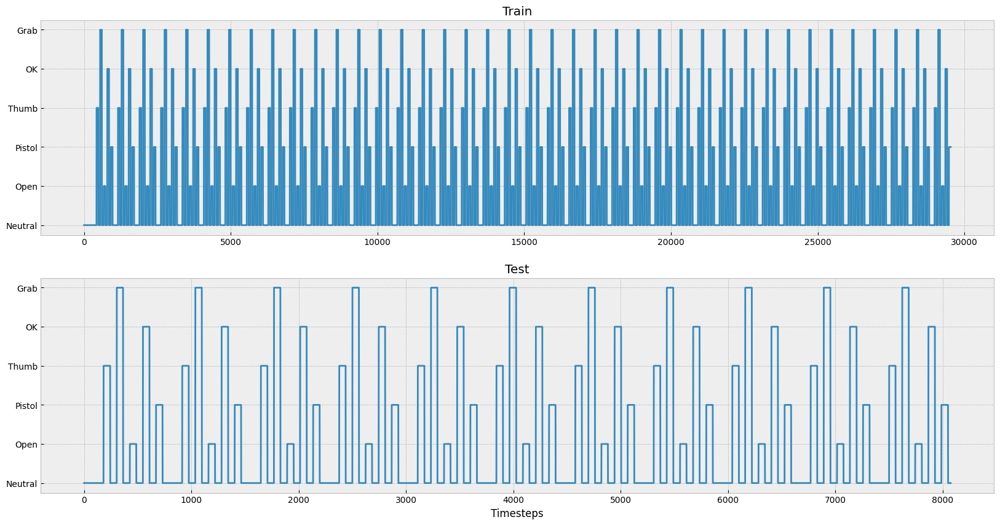

In [145]:
fig, ax = plt.subplots(2, 1, figsize=(20, 10))

sns.lineplot(y_train, ax=ax[0])
sns.lineplot(y_test, ax=ax[1])

ax[0].set_yticks(range(len(GESTURES)), GESTURES)
ax[0].set_title('Train')

ax[1].set_xlabel('Timesteps')
ax[1].set_yticks(range(len(GESTURES)), GESTURES)
ax[1].set_title('Test')

fig.show()

# Modeling, Prediction & Metrics

In [28]:
import sklearn.svm as svm
import sklearn.metrics as m
import catboost as cb 

import optuna

import joblib

In [53]:
def print_error(func):
    def func_w_error(*args, **kwargs):
        try:
            func(*args, **kwargs)
        except ValueError as ve:
            print(ve)
    
    return func_w_error


def get_f1(y, y_, sample):
    class_report = m.classification_report(
        y, y_, 
        target_names=GESTURES, 
        output_dict=True
        )
    
    scores_df = (
        pd.DataFrame(class_report)
        .loc['f1-score', GESTURES]
        .rename(sample)
        )
    
    return scores_df
    

@print_error
def model_report(model, Xy_set=(X_train, X_test, y_train, y_test)):
    X_train, X_test, y_train, y_test = Xy_set
    
    if isinstance(model, cb.CatBoostClassifier):
        model.fit(
            X = X_train, 
            y = y_train, 
            eval_set = [(X_test, y_test)], 
            early_stopping_rounds = 10, 
            verbose = False
        )
        
        y_pred_train = model.predict(X_train).reshape(1, -1)[0]
        y_pred_test = model.predict(X_test).reshape(1, -1)[0]
        
    else:
        model.fit(X_train, y_train)
    
        y_pred_train = model.predict(X_train)
        y_pred_test = model.predict(X_test)    
    
    if ((len(np.unique(y_pred_train)) != NUM_G) or 
        (len(np.unique(y_pred_test)) != NUM_G)):
        raise ValueError('Bad prediction') 
    
    fig, ax = plt.subplots(3, 1, figsize=(20, 15))

    train_f1 = get_f1(y_train, y_pred_train, 'train')
    test_f1 = get_f1(y_test, y_pred_test, 'test')
    
    scores = pd.concat([train_f1, test_f1], axis=1)
    sns.lineplot(scores, markers=True, ax=ax[0])
    
    ax[0].axhline(1, color='black')
    ax[0].axhline(0.9, color='black')
    ax[0].set_title('Scores')
    
    y_train_df = pd.DataFrame({'y_train': y_train, 'y_pred_train': y_pred_train})
    y_test_df = pd.DataFrame({'y_test': y_test, 'y_pred_test': y_pred_test})
    
    sns.lineplot(y_train_df, ax=ax[1])
    sns.lineplot(y_test_df, ax=ax[2])

    ax[1].set_yticks(range(NUM_G), GESTURES)
    ax[1].set_title('Train')

    ax[2].set_yticks(range(NUM_G), GESTURES)
    ax[2].set_title('Test')

    fig.show()   

### Baseline (SVM)

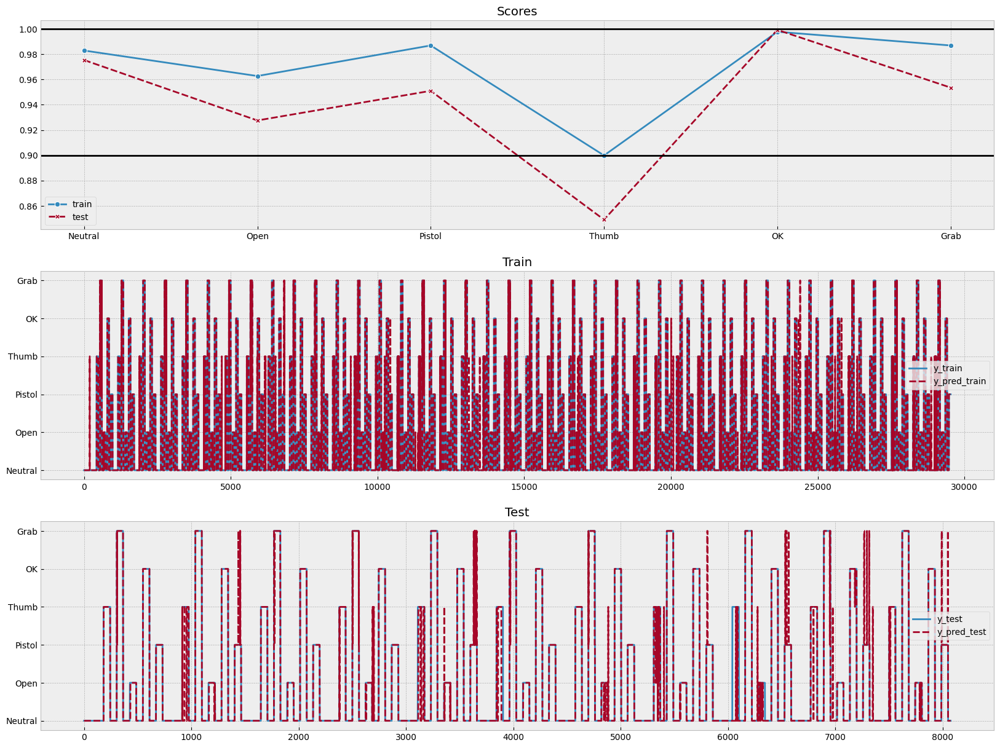

In [30]:
svm_model = svm.SVC(random_state=RS) 

model_report(svm_model) 

### Optimisation

In [31]:
def opt_svm(trial: optuna.trial.Trial):
    model = svm.SVC(
        C = trial.suggest_float('C', 0.00001, 5), 
        decision_function_shape = trial.suggest_categorical(
            'decision_function_shape', ['ovo', 'ovr']), 
        max_iter = trial.suggest_int('max_iter', 100, 10000, step=100)
    ).fit(X_train, y_train)

    y_pred = model.predict(X_test)
    
    if len(np.unique(y_pred)) != NUM_G:
        return 0
    else:
        score = m.classification_report(
            y_test, 
            y_pred, 
            target_names=GESTURES, 
            output_dict=True
            )
        
    return score['Thumb']['f1-score']
    

study_svm = optuna.create_study(study_name='SVM', direction='maximize')

study_svm.optimize(opt_svm, n_trials=30)

[I 2024-02-10 15:59:49,543] A new study created in memory with name: SVM
[I 2024-02-10 15:59:53,350] Trial 0 finished with value: 0.8792822185970636 and parameters: {'C': 3.7748181033778714, 'decision_function_shape': 'ovo', 'max_iter': 4700}. Best is trial 0 with value: 0.8792822185970636.
[I 2024-02-10 15:59:57,743] Trial 1 finished with value: 0.8730548730548731 and parameters: {'C': 1.7779214783903292, 'decision_function_shape': 'ovo', 'max_iter': 9000}. Best is trial 0 with value: 0.8792822185970636.
[I 2024-02-10 16:00:01,872] Trial 2 finished with value: 0.8760195758564436 and parameters: {'C': 2.6804613798819736, 'decision_function_shape': 'ovr', 'max_iter': 8500}. Best is trial 0 with value: 0.8792822185970636.
[I 2024-02-10 16:00:05,809] Trial 3 finished with value: 0.880195599022005 and parameters: {'C': 3.439722849235439, 'decision_function_shape': 'ovo', 'max_iter': 8700}. Best is trial 3 with value: 0.880195599022005.
[I 2024-02-10 16:00:12,564] Trial 4 finished with valu

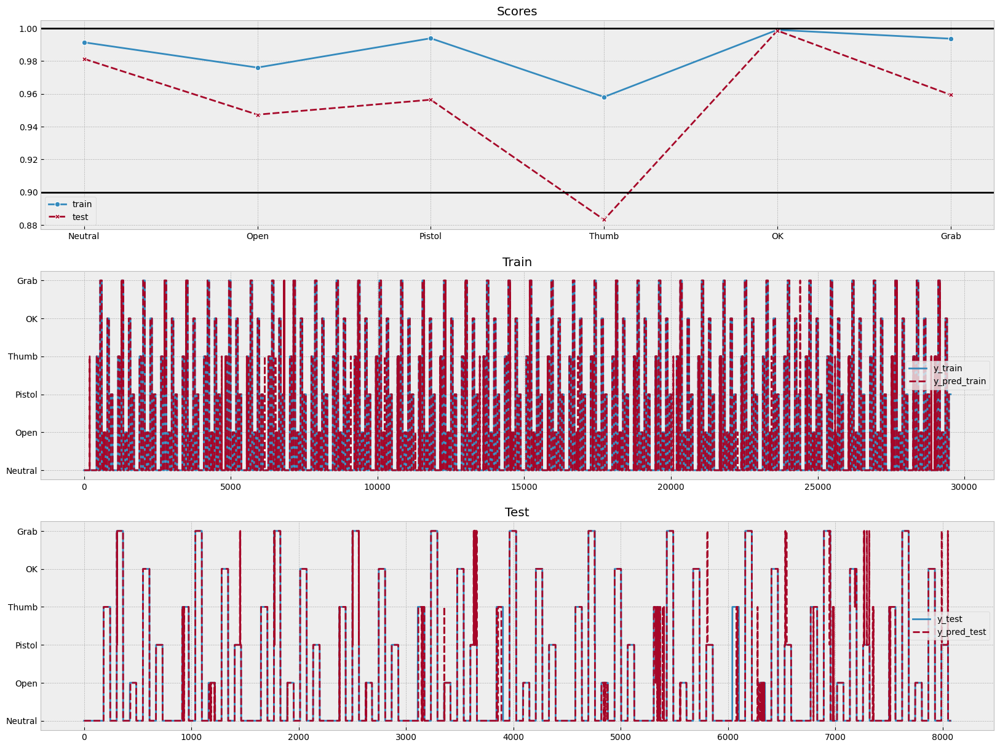

In [32]:
svm_opt = svm_model.set_params(**study_svm.best_params)

model_report(svm_opt)

# All data scoring

### SVM

In [33]:
scores_df = pd.DataFrame(
    columns=['train_score', 
             'test_score',
             'score_diff',
             'features', 
             'shift', 
             'window', 
             'split_index', 
             'pilote_id']
)


scores_df

,train_score,test_score,score_diff,features,shift,window,split_index,pilote_id


In [34]:
def read_protocol_csv(palm_file, gestures):
    gestures_protocol = pd.read_csv(f'{palm_file}.protocol.csv', index_col=0)
    
    le = pp.LabelEncoder()

    gestures_protocol['gesture'] = le.fit_transform(
        gestures_protocol[[
            "Thumb", "Index", "Middle", "Ring", "Pinky",
            'Thumb_stretch', 'Index_stretch', 'Middle_stretch', 'Ring_stretch', 'Pinky_stretch'
        ]]
        .apply(lambda row: str(tuple(row)), axis=1)
    )
    
    y_cmd = np.array([gestures_protocol['gesture'].loc[s] for s in gestures['SYNC'].values])
    
    return y_cmd

In [35]:
for i, data in enumerate(data_names):
    # READ DATA
    palm_file = './data/' + data
    gestures = read_omg_csv(palm_file, 
                            n_omg_channels=50,
                            n_acc_channels=3, 
                            n_gyr_channels=3, 
                            n_enc_channels=6, 
                            n_mag_channels=0)

    y_cmd = read_protocol_csv(palm_file, gestures)


    # SHIFTING
    gestures_omg_ch = gestures[OMG_CH]
    y_bin = pd.Series(y_cmd).apply(lambda x: 1 if x != 0 else x)
    
    best_shift = select_shift(gestures_omg_ch, y_bin)
    gestures_shifted = shift_data(gestures_omg_ch, best_shift)
    
    scores_df.loc[data, 'shift'] = best_shift
    
    
    # SCALING
    gestures_scaled = scale_data(gestures_shifted)
    
    
    # SMOOTHING        
    best_win = select_window(gestures_scaled, y_bin)
    gestures_smoothed = smoothe_data(gestures_scaled, best_win)
    
    scores_df.loc[data, 'window'] = best_win
    
    
    # FEATURE CLEANING
    best_cols = select_features(gestures_smoothed, y_bin)
    gestures_cleaned = gestures_smoothed[best_cols]
    
    scores_df.loc[data, 'features'] = best_cols
    
    
    # SAMPLE CLEANING
    X_data = clean_data(gestures_cleaned, y_cmd)
    
    
    # TRAIN TEST SPLIT
    data_splitted = train_test_split(palm_file, X_data, y_cmd)
    
    X_train, X_test, y_train, y_test = data_splitted[:4]
    
    scores_df.loc[data, 'split_index'] = data_splitted[-2]
    scores_df.loc[data, 'pilote_id'] = data_splitted[-1]
    
    
    # MODEL SCORING    
    svm_opt.fit(X_train, y_train)
    
    y_pred_train = svm_opt.predict(X_train)
    y_pred_test = svm_opt.predict(X_test)
    
    if ((len(np.unique(y_pred_train)) != NUM_G) or 
        (len(np.unique(y_pred_test)) != NUM_G)):
        train_f1, test_f1 = 0, 0
    else:
        train_f1 = 100 * m.f1_score(y_train, y_pred_train, average='weighted')
        test_f1 = 100 * m.f1_score(y_test, y_pred_test, average='weighted')
        
    scores_df.loc[data, 'train_score'] = round(train_f1, 1)
    scores_df.loc[data, 'test_score'] = round(test_f1, 1)
    scores_df.loc[data, 'score_diff'] = round(train_f1-test_f1, 1)
    
    
    # VERBOSITY
    print(f'Session №{i} with {data} is done')

Session №0 with 2023-04-18_19-08-47 gestures train.palm is done
Session №1 with 2023-05-05_17-57-30.palm is done
Session №2 with 2023-05-07_15-19-05.palm is done
Session №3 with 2023-05-07_16-54-27.palm is done
Session №4 with 2023-05-12_19-17-00.palm is done
Session №5 with 2023-05-15_16-16-08.palm is done
Session №6 with 2023-05-15_17-12-24.palm is done
Session №7 with 2023-05-19_12-04-02.palm is done
Session №8 with 2023-05-22_17-04-29.palm is done
Session №9 with 2023-05-22_20-22-01.palm is done
Session №10 with 2023-05-31_15-46-37.palm is done
Session №11 with 2023-05-31_17-14-41.palm is done
Session №12 with 2023-06-05_16-12-38.palm is done
Session №13 with 2023-06-05_17-53-01.palm is done
Session №14 with 2023-06-20_12-34-17.palm is done
Session №15 with 2023-06-20_13-30-15.palm is done
Session №16 with 2023-06-20_14-43-11.palm is done
Session №17 with 2023-09-12_12-55-22.palm is done
Session №18 with 2023-09-12_14-59-23.palm is done
Session №19 with 2023-09-13_22-14-05.palm is 

In [36]:
scores_df.sort_values('test_score') 

,train_score,test_score,score_diff,features,shift,window,split_index,pilote_id
2023-10-25_11-08-46.palm,97.4,54.9,42.5,"[1, 3, 4, 5, 9, 11, 13, 14, 15, 16, 18, 19, 25...",0,19,3539,2
2023-06-05_16-12-38.palm,94.6,58.2,36.3,"[1, 2, 5, 6, 13, 14, 15, 16, 17, 21, 24, 26, 2...",-12,9,17939,1
2023-06-20_14-43-11.palm,91.8,61.7,30.1,"[1, 5, 7, 9, 12, 13, 16, 17, 21, 22, 25, 33, 3...",-9,11,17936,1
2023-06-05_17-53-01.palm,91.7,61.9,29.8,"[3, 8, 11, 12, 17, 21, 22, 28, 30, 31, 32, 38,...",-9,10,17771,1
2023-05-15_17-12-24.palm,93.7,66.1,27.6,"[0, 2, 3, 4, 7, 10, 11, 12, 15, 16, 28, 31, 38...",-11,15,23336,1
2023-06-20_12-34-17.palm,95.3,83.3,12.0,"[2, 3, 6, 7, 12, 13, 14, 15, 16, 21, 22, 24, 2...",-15,7,17758,1
2023-05-15_16-16-08.palm,96.8,85.0,11.8,"[2, 3, 4, 11, 16, 18, 26, 27, 28, 29, 30, 31, ...",-22,19,23337,1
2023-06-20_13-30-15.palm,98.3,86.7,11.7,"[3, 6, 8, 12, 14, 15, 17, 21, 22, 24, 28, 30, ...",-18,8,17928,1
2023-10-23_16-23-02.palm,98.1,88.6,9.6,"[0, 8, 11, 12, 18, 22, 23, 26, 27, 33, 34, 35]",-15,17,5675,2
2023-10-18_08-05-29.palm,98.9,88.9,9.9,"[0, 1, 8, 11, 12, 22, 26, 27, 33, 34, 35, 36]",-16,1,5681,2


In [56]:
scores_df[['train_score', 'test_score', 'score_diff']].mean() 

train_score    98.080645
test_score     89.432258
score_diff      8.654839
dtype: object

### Overfitting & Thumb problem (Boosting)

In [57]:
bad_palm = (scores_df
            [scores_df['score_diff'] >= 5]
            .sort_values('score_diff', ascending=False)
            .iloc[0])

bad_palm

train_score                                                 97.4
test_score                                                  54.9
score_diff                                                  42.5
features       [1, 3, 4, 5, 9, 11, 13, 14, 15, 16, 18, 19, 25...
shift                                                          0
window                                                        19
split_index                                                 3539
pilote_id                                                      2
Name: 2023-10-25_11-08-46.palm, dtype: object

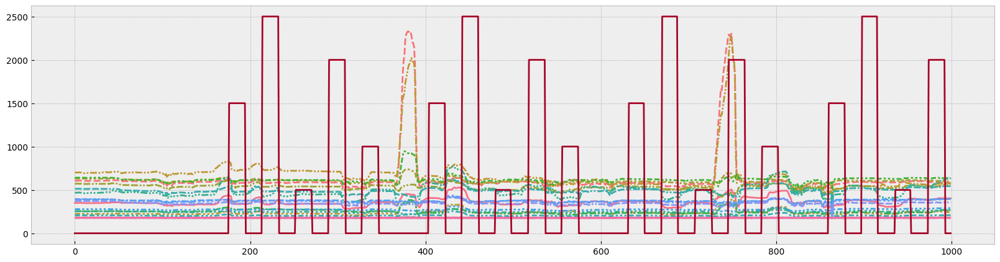

In [58]:
# DATA
bad_file = './data/'+bad_palm.name

bad_df = read_omg_csv(bad_file, 
                      n_omg_channels=50,
                      n_acc_channels=3, 
                      n_gyr_channels=3, 
                      n_enc_channels=6, 
                      n_mag_channels=0)

bad_y = read_protocol_csv(bad_file, bad_df)

bad_omg = bad_df[OMG_CH]


plt.figure(figsize=(20, 5))
sns.lineplot(bad_df[OMG_CH].iloc[:1000], legend=False)
sns.lineplot(bad_y[:1000]*500)

plt.show()

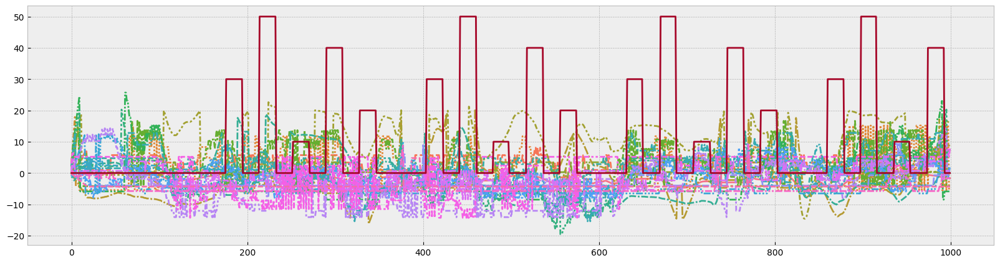

In [59]:
def preprocess_data(params, data, target):
    # SHIFTING
    shifted = shift_data(data, params.loc['shift'])

    # SCALING
    scaled = scale_data(shifted)

    # SMOOTHING
    smoothed = smoothe_data(scaled, params.loc['window'])

    # FEATURE CLEANING
    cleaned = smoothed[params.loc['features']]

    # SAMPLE CLEANING
    X_data = clean_data(cleaned, target)

    # TRAIN TEST SPLIT
    last_train_idx = params.loc['split_index']

    X_train = X_data.loc[:last_train_idx-1]
    y_train = target[:last_train_idx]

    X_test = X_data.loc[last_train_idx:]
    y_test = target[last_train_idx:]
    
    return X_train, X_test, y_train, y_test


X_train, X_test, y_train, y_test = preprocess_data(bad_palm, bad_omg, bad_y)

plt.figure(figsize=(20, 5))
sns.lineplot(X_train.iloc[:1000], legend=False)
sns.lineplot(bad_y[:1000]*10)

plt.show()

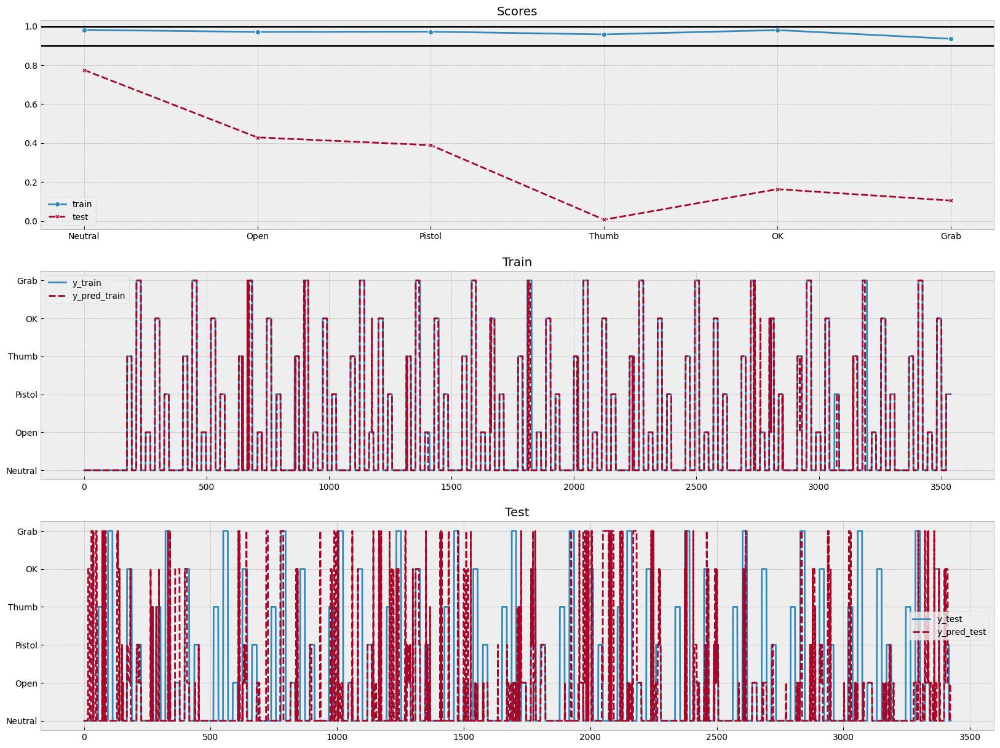

In [61]:
model_report(svm_opt, Xy_set=(X_train, X_test, y_train, y_test)) 

In [42]:
def opt_cat(trial: optuna.trial.Trial):
    model = cb.CatBoostClassifier(
        learning_rate = trial.suggest_float('learning_rate', 0.00001, 1), 
        depth = trial.suggest_int('depth', 2, 16),  
        iterations = 10000, 
        custom_metric = 'F1', 
        classes_count = NUM_G,
        random_state = RS, 
        verbose = 0
    ).fit(
        X = X_train, 
        y = y_train, 
        eval_set = [(X_test, y_test)], 
        early_stopping_rounds = 10, 
        verbose = False
    )
    
    y_pred = model.predict(X_test)
    
    if len(np.unique(y_pred)) != NUM_G:
        return 0
    else:
        score = m.classification_report(
            y_test, 
            y_pred, 
            target_names=GESTURES, 
            output_dict=True)
    
    return score['Thumb']['f1-score']
    

study_cat = optuna.create_study(study_name='meow', direction='maximize')

study_cat.optimize(opt_cat, n_trials=30)

[I 2024-02-10 16:05:10,313] A new study created in memory with name: meow
[I 2024-02-10 16:05:11,268] Trial 0 finished with value: 0.24456521739130435 and parameters: {'learning_rate': 0.7059822338107945, 'depth': 9}. Best is trial 0 with value: 0.24456521739130435.
[I 2024-02-10 16:23:19,491] Trial 1 finished with value: 0.1369047619047619 and parameters: {'learning_rate': 0.1358354571186803, 'depth': 15}. Best is trial 0 with value: 0.24456521739130435.
[I 2024-02-10 16:23:24,332] Trial 2 finished with value: 0.20454545454545453 and parameters: {'learning_rate': 0.5184320411102108, 'depth': 10}. Best is trial 0 with value: 0.24456521739130435.
[I 2024-02-10 16:23:26,370] Trial 3 finished with value: 0.24444444444444446 and parameters: {'learning_rate': 0.6634950416865159, 'depth': 10}. Best is trial 0 with value: 0.24456521739130435.
[I 2024-02-10 16:23:26,526] Trial 4 finished with value: 0.41899441340782123 and parameters: {'learning_rate': 0.5637090029748485, 'depth': 2}. Best is 

In [62]:
study_cat.best_params 

{'learning_rate': 0.7576109923683022, 'depth': 2}

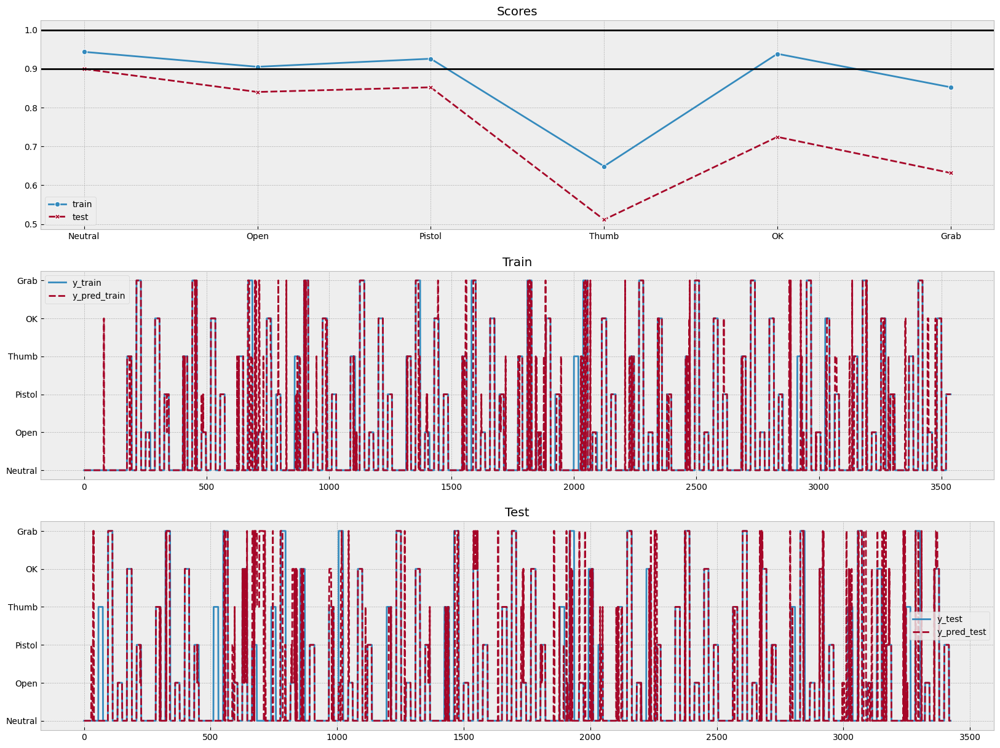

In [63]:
cat_model = cb.CatBoostClassifier(
    iterations=10000,
    custom_metric = 'F1', 
    classes_count = NUM_G,
    od_type = 'Iter',
    random_state = RS, 
    verbose = 0
    ).set_params(**study_cat.best_params)


model_report(cat_model, Xy_set=(X_train, X_test, y_train, y_test))

In [45]:
new_scores = scores_df.copy()


for i, data in enumerate(new_scores.index):
    # READ DATA
    palm_file = './data/' + data
    gestures = read_omg_csv(palm_file, 
                            n_omg_channels=50,
                            n_acc_channels=3, 
                            n_gyr_channels=3, 
                            n_enc_channels=6, 
                            n_mag_channels=0)

    y_cmd = read_protocol_csv(palm_file, gestures)


    # PREPROCESSING
    gestures_omg_ch = gestures[OMG_CH]
    palm_params = new_scores.loc[data]
    
    X_train, X_test, y_train, y_test = preprocess_data(palm_params, gestures_omg_ch, y_cmd)
    

    # MODEL SCORING
    cat_model.fit(
        X = X_train, 
        y = y_train, 
        eval_set = [(X_test, y_test)], 
        early_stopping_rounds = 10, 
        verbose = False
    )
    
    y_pred_train = cat_model.predict(X_train)
    y_pred_test = cat_model.predict(X_test)
    
    if ((len(np.unique(y_pred_train)) != NUM_G) or 
        (len(np.unique(y_pred_test)) != NUM_G)):
        train_f1, test_f1 = 0, 0
        
    else:
        train_f1 = 100 * m.f1_score(y_train, y_pred_train, average='weighted')
        test_f1 = 100 * m.f1_score(y_test, y_pred_test, average='weighted')
        
    new_scores.loc[data, 'train_score'] = round(train_f1, 1)
    new_scores.loc[data, 'test_score'] = round(test_f1, 1)
    new_scores.loc[data, 'score_diff'] = round(train_f1-test_f1, 1)
    
    
    # VERBOSITY
    print(f'Session №{i} with {data} is done')

Session №0 with 2023-04-18_19-08-47 gestures train.palm is done
Session №1 with 2023-05-05_17-57-30.palm is done
Session №2 with 2023-05-07_15-19-05.palm is done
Session №3 with 2023-05-07_16-54-27.palm is done
Session №4 with 2023-05-12_19-17-00.palm is done
Session №5 with 2023-05-15_16-16-08.palm is done
Session №6 with 2023-05-15_17-12-24.palm is done
Session №7 with 2023-05-19_12-04-02.palm is done
Session №8 with 2023-05-22_17-04-29.palm is done
Session №9 with 2023-05-22_20-22-01.palm is done
Session №10 with 2023-05-31_15-46-37.palm is done
Session №11 with 2023-05-31_17-14-41.palm is done
Session №12 with 2023-06-05_16-12-38.palm is done
Session №13 with 2023-06-05_17-53-01.palm is done
Session №14 with 2023-06-20_12-34-17.palm is done
Session №15 with 2023-06-20_13-30-15.palm is done
Session №16 with 2023-06-20_14-43-11.palm is done
Session №17 with 2023-09-12_12-55-22.palm is done
Session №18 with 2023-09-12_14-59-23.palm is done
Session №19 with 2023-09-13_22-14-05.palm is 

In [46]:
new_scores.sort_values('score_diff', ascending=False) 

,train_score,test_score,score_diff,features,shift,window,split_index,pilote_id
2023-06-05_16-12-38.palm,95.6,83.9,11.7,"[1, 2, 5, 6, 13, 14, 15, 16, 17, 21, 24, 26, 2...",-12,9,17939,1
2023-10-18_08-05-29.palm,97.2,86.7,10.5,"[0, 1, 8, 11, 12, 22, 26, 27, 33, 34, 35, 36]",-16,1,5681,2
2023-06-20_14-43-11.palm,95.6,86.0,9.6,"[1, 5, 7, 9, 12, 13, 16, 17, 21, 22, 25, 33, 3...",-9,11,17936,1
2023-06-05_17-53-01.palm,95.4,85.8,9.6,"[3, 8, 11, 12, 17, 21, 22, 28, 30, 31, 32, 38,...",-9,10,17771,1
2023-10-25_11-08-46.palm,90.8,82.3,8.5,"[1, 3, 4, 5, 9, 11, 13, 14, 15, 16, 18, 19, 25...",0,19,3539,2
2023-06-20_12-34-17.palm,97.5,89.5,8.0,"[2, 3, 6, 7, 12, 13, 14, 15, 16, 21, 22, 24, 2...",-15,7,17758,1
2023-10-23_16-23-02.palm,98.3,91.7,6.5,"[0, 8, 11, 12, 18, 22, 23, 26, 27, 33, 34, 35]",-15,17,5675,2
2023-05-07_15-19-05.palm,99.5,93.9,5.6,"[3, 4, 5, 6, 7, 15, 16, 17, 18, 20, 22, 26, 27...",-15,19,5361,3
2023-10-25_08-52-30.palm,98.9,93.5,5.4,"[0, 1, 11, 12, 17, 18, 22, 26, 27, 33, 34, 35,...",-17,1,5674,2
2023-06-20_13-30-15.palm,99.3,95.7,3.6,"[3, 6, 8, 12, 14, 15, 17, 21, 22, 24, 28, 30, ...",-18,8,17928,1


In [65]:
new_scores[['train_score', 'test_score', 'score_diff']].mean() 

train_score    98.532258
test_score     95.077419
score_diff      3.451613
dtype: object

# Save best model

In [66]:
model_path = './models/CatBoost_GesturesClassifier.pkl'
joblib.dump(cat_model, model_path)

print(joblib.load(model_path), f'\nSaved at {model_path}')

Saved at ./models/CatBoost_GesturesClassifier.pkl


-----

# Real-time inference

In [146]:
import time
import serial 
from IPython.display import clear_output

In [147]:
crc_table = [
    54, 181, 83, 241, 89, 16, 164, 217, 34, 169, 220, 160, 11, 252,
    111, 241, 33, 70, 99, 240, 234, 215, 60, 206, 68, 126, 152, 81,
    113, 187, 14, 21, 164, 172, 251, 16, 248, 215, 236, 90, 49, 53,
    179, 156, 101, 55, 65, 130, 161, 22, 218, 79, 24, 168, 152, 205,
    115, 141, 23, 86, 141, 58, 122, 215, 252, 48, 69, 115, 138, 66,
    88, 37, 63, 104, 176, 46, 139, 246, 222, 184, 103, 92, 154, 174,
    97, 141, 195, 166, 227, 150, 140, 48, 121, 243, 13, 131, 210, 199,
    45, 75, 180, 104, 97, 82, 251, 90, 132, 111, 229, 175, 146, 216,
    153, 86, 166, 33, 184, 100, 225, 248, 186, 54, 89, 39, 2, 214, 2,
    114, 197, 6, 35, 188, 245, 64, 220, 37, 123, 132, 190, 60, 189, 53,
    215, 185, 238, 145, 99, 226, 79, 54, 102, 118, 210, 116, 51, 247,
    0, 191, 42, 45, 2, 132, 106, 52, 63, 159, 229, 157, 78, 165, 50,
    18, 108, 193, 166, 253, 3, 243, 126, 111, 199, 152, 36, 114, 147,
    57, 87, 14, 16, 160, 128, 97, 189, 51, 115, 142, 8, 70, 71, 55, 42,
    193, 65, 207, 122, 158, 26, 21, 72, 139, 33, 230, 230, 116, 134, 5,
    213, 165, 107, 41, 134, 219, 190, 26, 29, 136, 174, 190, 108, 185, 172,
    137, 239, 164, 208, 207, 206, 98, 207, 12, 0, 174, 64, 20, 90, 49, 12,
    67, 112, 109, 78, 114, 165, 244, 183, 121
]

    
def get_crc(data, count):
    result = 0x00
    l = count
    
    while count > 0:   
        result = crc_table[result ^ data[l-count]]
        count -= 1
        
    return result


def drv_abs_one(ser, control):
    if ser is None:
        return
    
    pack = np.array(([80, 0x01, 0xBB, 6] + 
                     [c for c in control] + 
                     [0]), 
                    dtype='uint8')
    pack[-1] = get_crc(pack[1:], 9)
    
    return pack, ser.write(bytearray(pack))

## Inference Utils: Put your code here

In [164]:
model = joblib.load(model_path)

print(type(model))

model.get_params()

<class 'catboost.core.CatBoostClassifier'>


{'iterations': 10000,
 'od_type': 'Iter',
 'verbose': 0,
 'classes_count': 6,
 'custom_metric': 'F1',
 'random_state': 8,
 'learning_rate': 0.7576109923683022,
 'depth': 2}

In [149]:
last_train_idx = train_test_split(palm_file, gestures)[-2]

df_sim = gestures.iloc[last_train_idx:]

scaler = pp.StandardScaler()
scaler.fit(df_sim[OMG_CH])

print(df_sim.shape)

(8076, 65)


In [150]:
def preprocessing(x):
    # x - sample vector
    y = scaler.transform([x])
    
    return y


def inference(x):
    y = model.predict(x).reshape(1, -1)[0]
    
    return y


def postprocessing(x, prev):
    if prev is None:
        y = x
    else:
        y = (x*0.1) + (prev*0.9) # Holt-Winters filter
        
    return y


def commands(x):
    y = np.round(np.clip(x/100, 0, 1) * 100).astype(int)
    return y

## Inference

### Offline (dataset)

In [168]:
TIMEOUT = 0.033
DEBUG = False
    
i = 0
ts_old = time.time()
ts_diff = 0

y_previous = None
y_dct = {
    'omg_sample': [],
    'enc_sample': [],
    'sample_preprocessed': [],
    'y_predicted': [],
    'y_postprocessed': [],
    'y_commands': [],
}


while True:    
    # [Data reading]
    ts_start = time.time()
    
    try:
        # [Sim data]
        if i < X_test.shape[0]:
            sample = df_sim.values[i]
        else:
            break
        
        [omg_sample, acc_sample, enc_sample, [button, sync, ts]] = np.array_split(sample, [50, 56, 62])
        
    except Exception as e:
        print(e)
        
    # [Data preprocessing]
    sample_preprocessed = preprocessing(omg_sample)
    
    # [Inference]
    y_predicted = inference(sample_preprocessed)
    
    # [Inference Postprocessing]
    y_postprocessed = postprocessing(y_predicted, y_previous)
    
    # [Commands composition]
    y_commands = commands(y_postprocessed)
    
    # [Commands sending]
    # NO COMMANDS SENDING IN SIMULATION
    
    # [Data logging]
    y_dct['omg_sample'].append(omg_sample)
    y_dct['enc_sample'].append(enc_sample)
    y_dct['sample_preprocessed'].append(sample_preprocessed)
    y_dct['y_predicted'].append(y_predicted)
    y_dct['y_postprocessed'].append(y_postprocessed)
    y_dct['y_commands'].append(y_commands)

    y_previous = y_postprocessed
    
    if DEBUG:
        clear_output(wait=True)

        # sanity check: Sizes of SAMPLE=65, OMG=50, ACC=6, ENCODERS=6
        print(f'SAMPLE SIZE: {len(sample)}, OMG: {len(omg_sample)}, ACC: {len(acc_sample)}, ENCODERS: {len(enc_sample)}')
        print(f'BUTTON: {button}, SYNC: {sync}, TS: {ts}')
        print(y_commands)
    
    ts_diff = time.time() - ts_start
    
    assert ts_diff < TIMEOUT, 'Calculation cycle takes more than TIMEOUT, halting...'
    
    ts_old = ts_start
    i += 1 

In [169]:
for key, val in y_dct.items():
    # print(f"len({key}) = {len(y_dct[key])}")
    y_dct[key] = np.stack(val)
    print(f"{key}.shape = {y_dct[key].shape}")

omg_sample.shape = (8076, 50)
enc_sample.shape = (8076, 6)
sample_preprocessed.shape = (8076, 1, 50)
y_predicted.shape = (8076, 1)
y_postprocessed.shape = (8076, 1)
y_commands.shape = (8076, 1)


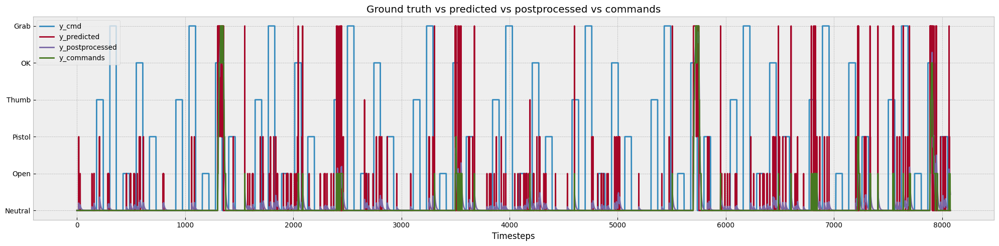

In [170]:
plt.figure(figsize=(20, 5))

plt.plot(y_test, c='C0', label='y_cmd')
plt.plot(y_dct['y_predicted'], c='C1', label='y_predicted')
plt.plot(y_dct['y_postprocessed'], c='C2', label='y_postprocessed')
plt.plot(y_dct['y_commands'], c='C3', label='y_commands')

plt.title('Ground truth vs predicted vs postprocessed vs commands')
plt.yticks(np.arange(len(GESTURES)), GESTURES)
plt.legend()
plt.xlabel('Timesteps')

plt.tight_layout()

In [171]:
print(m.classification_report(y_test, 
                              y_dct['y_commands'], 
                              target_names=GESTURES)) 

              precision    recall  f1-score   support

     Neutral       0.59      0.96      0.73      4728
        Open       0.00      0.00      0.00       665
      Pistol       0.00      0.00      0.00       672
       Thumb       0.00      0.00      0.00       671
          OK       0.77      0.06      0.12       670
        Grab       0.00      0.00      0.00       670

    accuracy                           0.57      8076
   macro avg       0.23      0.17      0.14      8076
weighted avg       0.41      0.57      0.44      8076



### Online (prosthesis or virtual hand)

In [ ]:
TIMEOUT = 0.033
DEBUG = True

ser = None
# ser_port = None
# ser_port = '/dev/ttyACM0'
ser_port = '/dev/cu.usbmodem3498365F31351'

if ser_port is not None:
    ser = serial.Serial(port=ser_port, timeout=2*TIMEOUT)
    ser.write('T1#\r\n'.encode('utf-8')) # T1 for Timestamp activate
    ser.write('M2#\r\n'.encode('utf-8')) # M2 for Mode == 2 = send samples
    ser.write('S2#\r\n'.encode('utf-8')) # SYNC to 2 for sanity check

    # flush buffers
    ser.reset_input_buffer()
    ser.read()
    
    i = 0;
    while(ser.in_waiting):
        print(f'Flushing buffers {i}: {ser.in_waiting}', end='    \r')
        ser.read_all()
        time.sleep(0.005)
        i+=1;
    ser.readline()
    ser.readline()
    
i = 0
ts_old = time.time()
ts_diff = 0;

y_previous = None
while True:    
    
    # [Data reading]
    s = ser.readline()
    ts_start = time.time()
    
    try:
        sample = np.array(s.decode('UTF-8')\
                           .replace('\r\n', "")\
                           .split(' ')
                         ).astype(int)
        [omg_sample, acc_sample, enc_sample, [button, sync, ts]] = np.array_split(sample, [50, 56, 62])
        
    except Exception as e:
        print(e)
        
    # [/Data Reading]
        
    # [Data preprocessing]
    sample_preprocessed = preprocessing(omg_sample)
    # [/Data preprocessing]
    
    # [Inference]
    y_predicted         = inference(sample_preprocessed)
    # [/Inference]
    
    # [Inference Postprocessing]
    y_postprocessed     = postprocessing(y_predicted, y_previous)
    # [/Inference Postprocessing]
    
    # [Commands composition]
    y_commands          = commands(y_postprocessed)
    # [/Commands composition]
    
    # [Commands sending]
    pack, _ = drv_abs_one(ser, list(y_commands)); # + [0]
    # [/Commands sending]
    
    y_previous = y_postprocessed
    
    if DEBUG:
        clear_output(wait=True)

        # sanity check: iteration should increase monotonically, TIMEDIFF approximately 32-34 ms, CYCLETIME < TIMEOUT, WAITING should be == 0
        print(f'ITERATION:\t{i}\tTIMEDIFF:\t{(ts_start - ts_old)*1000: .0f}\tCYCLETIME:\t{ts_diff*1000:.0f}\tWAITING:\t{ser.in_waiting}')
        print('INPUT:\n', s)

        # sanity check: Sizes of SAMPLE=65, OMG=50, ACC=6, ENCODERS=6
        print(f'SAMPLE SIZE: {len(sample)}, OMG: {len(omg_sample)}, ACC: {len(acc_sample)}, ENCODERS: {len(enc_sample)}')
        print(f'BUTTON: {button}, SYNC: {sync}, TS: {ts}')
        print(y_commands)
        print(pack)
    
    ts_diff = time.time() - ts_start
    assert(ts_diff<TIMEOUT), 'Calculation cycle takes more than TIMEOUT, halting...'
    ts_old = ts_start
    i += 1 